<img src="https://gitlab.com/bivl2ab/academico/cursos-uis/ai/ai-uis-student/raw/master/imgs/banner_IA.png"  width="1000px" height="250px">



# <center> **AVANCE PROYECTO FINAL:** </center>
# <center> **Sistema de Monitoreo de Acciones Peligrosas en el Conductor** </center>
# <center> **Iván Augusto Camargo López - 2230033** </center>
# <center> **Santiago Torres - 2202024** </center>



## **Índice**
1. **Importación del Dataset**
2. **Reducción de Dimensiones: PCA/TSNE**
3. **Reducción de Dimensiones: Otros Algoritmos**
4. **Métodos de Agrupamiento: K-Means, DBSCAN y Aglomerative Clustering**
5. **Métodos de Agrupamiento: Otros Algoritmos**

# 1. **Importación del Dataset**

* Recordando, para este momento se han extraído las posturas de **16** sujetos distintos, Procedentes de la utilización de **VitPose** y **MediaPipe** para la identificación de **landmarks**

* Ya tenemos el dataset. Es momento de cargarlo para realizar un análisis desde el punto de vista del aprendizaje no supervisado.




In [ ]:
#@title Cargar el Dataset Final (ya procesado)

import pandas as pd
from google.colab import drive
import numpy as np

# Montar Google Drive
drive.mount('/content/drive')

path = "/content/drive/MyDrive/DMD_Dataset_Project_Processed.csv"

df = pd.read_csv(path)
df.head()

Mounted at /content/drive


<ipython-input-1-224398f1916b>:12: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path)


,Unnamed: 0,indice_video,lmk_0_x,lmk_0_y,lmk_0_z,lmk_1_x,lmk_1_y,lmk_1_z,lmk_2_x,lmk_2_y,...,lmk_hand_125_y,lmk_hand_127_x,lmk_hand_127_y,lmk_hand_129_x,lmk_hand_129_y,lmk_hand_131_x,lmk_hand_131_y,blinks,eyes_state,yawning
0,0,1.1,0.466321,0.664493,-0.030458,0.464244,0.610660,-0.037667,0.463933,0.632606,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0
1,1,1.2,0.466716,0.667113,-0.030338,0.464099,0.612234,-0.037929,0.464176,0.634038,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0
2,2,1.3,0.446711,0.726543,-0.025353,0.444824,0.676071,-0.040332,0.445900,0.693371,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0
3,3,1.4,0.472639,0.689401,-0.027664,0.472933,0.639516,-0.037768,0.472006,0.659946,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0
4,4,1.5,0.472732,0.689614,-0.027691,0.473167,0.639140,-0.037587,0.472129,0.659548,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0


In [ ]:
df = df.drop('Unnamed: 0', axis = 1)

In [ ]:
df.head()

,indice_video,lmk_0_x,lmk_0_y,lmk_0_z,lmk_1_x,lmk_1_y,lmk_1_z,lmk_2_x,lmk_2_y,lmk_2_z,...,lmk_hand_125_y,lmk_hand_127_x,lmk_hand_127_y,lmk_hand_129_x,lmk_hand_129_y,lmk_hand_131_x,lmk_hand_131_y,blinks,eyes_state,yawning
0,1.1,0.466321,0.664493,-0.030458,0.464244,0.610660,-0.037667,0.463933,0.632606,-0.024851,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0
1,1.2,0.466716,0.667113,-0.030338,0.464099,0.612234,-0.037929,0.464176,0.634038,-0.024461,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0
2,1.3,0.446711,0.726543,-0.025353,0.444824,0.676071,-0.040332,0.445900,0.693371,-0.023093,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0
3,1.4,0.472639,0.689401,-0.027664,0.472933,0.639516,-0.037768,0.472006,0.659946,-0.023609,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0
4,1.5,0.472732,0.689614,-0.027691,0.473167,0.639140,-0.037587,0.472129,0.659548,-0.023432,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0


In [ ]:
df.shape

(92491, 1452)

# 2. **Reducción de Dimensiones: PCA/TSNE**



*   Vamos a recordar los dos métodos de ML que nos han proporcionado mejores métricas de clasificación hasta el momento:

*   (Ahora vamos a particionar el train test en "80/20", pero con sujetos: 13 sujetos para train, y 3 sujetos para test)



In [ ]:
#@title Importaciones

from sklearn.model_selection import cross_validate, KFold
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from IPython.display import display
from sklearn.model_selection import train_test_split
from sklearn.metrics import *
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

import tensorflow as tf
from tensorflow import keras
!pip install scikeras
!pip install --upgrade scikit-learn scikeras

# **Random Forest Classifier**

In [ ]:
# Asegurar que 'indice_video' es string
df['indice_video'] = df['indice_video'].astype(str)

# Extraer el ID del sujeto (la parte antes del primer punto)
df['sujeto'] = df['indice_video'].str.extract(r'^([^\.]+)')[0]

# Definir listas de sujetos
sujetos_train = [str(i) for i in range(1, 10)] + ['10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

# Crear particiones
df_train = df[df['sujeto'].isin(sujetos_train)].copy()
df_test = df[df['sujeto'].isin(sujetos_test)].copy()


# Eliminar columnas objetivo y auxiliares
X_train = df_train.drop(columns=["yawning", "indice_video", 'blinks', 'eyes_state', 'sujeto'])
X_test  = df_test.drop(columns=["yawning", "indice_video", 'blinks', 'eyes_state', 'sujeto'])

# Etiquetas
y1_train, y1_test = df_train['blinks'], df_test['blinks']
y2_train, y2_test = df_train['eyes_state'], df_test['eyes_state']
y3_train, y3_test = df_train['yawning'], df_test['yawning']

est = RandomForestClassifier(n_estimators=200, random_state=42)

metricas = {}

# --- BLINKS ---
est.fit(X_train, y1_train)
y_pred_train = est.predict(X_train)
y_pred_test = est.predict(X_test)

metricas['blinks'] = {
    'train_Accuracy': "%.3f"%(accuracy_score(y1_train, y_pred_train)),
    'test_Accuracy': "%.3f"%(accuracy_score(y1_test, y_pred_test)),
    'train_Precision': "%.3f"%(precision_score(y1_train, y_pred_train, average='weighted')),
    'test_Precision': "%.3f"%(precision_score(y1_test, y_pred_test, average='weighted')),
    'train_Recall': "%.3f"%(recall_score(y1_train, y_pred_train, average='weighted')),
    'test_Recall': "%.3f"%(recall_score(y1_test, y_pred_test, average='weighted')),
    'train_F1_Score': "%.3f"%(f1_score(y1_train, y_pred_train, average='weighted')),
    'test_F1_Score': "%.3f"%(f1_score(y1_test, y_pred_test, average='weighted')),
    'train_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y1_train, y_pred_train)),
    'test_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y1_test, y_pred_test)),
}

# --- EYES STATE ---
est.fit(X_train, y2_train)
y_pred_train = est.predict(X_train)
y_pred_test = est.predict(X_test)

metricas['eyes_state'] = {
    'train_Accuracy': "%.3f"%(accuracy_score(y2_train, y_pred_train)),
    'test_Accuracy': "%.3f"%(accuracy_score(y2_test, y_pred_test)),
    'train_Precision': "%.3f"%(precision_score(y2_train, y_pred_train, average='weighted')),
    'test_Precision': "%.3f"%(precision_score(y2_test, y_pred_test, average='weighted')),
    'train_Recall': "%.3f"%(recall_score(y2_train, y_pred_train, average='weighted')),
    'test_Recall': "%.3f"%(recall_score(y2_test, y_pred_test, average='weighted')),
    'train_F1_Score': "%.3f"%(f1_score(y2_train, y_pred_train, average='weighted')),
    'test_F1_Score': "%.3f"%(f1_score(y2_test, y_pred_test, average='weighted')),
    'train_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y2_train, y_pred_train)),
    'test_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y2_test, y_pred_test)),
}

# --- YAWNING ---
est.fit(X_train, y3_train)
y_pred_train = est.predict(X_train)
y_pred_test = est.predict(X_test)

metricas['yawning'] = {
    'train_Accuracy': "%.3f"%(accuracy_score(y3_train, y_pred_train)),
    'test_Accuracy': "%.3f"%(accuracy_score(y3_test, y_pred_test)),
    'train_Precision': "%.3f"%(precision_score(y3_train, y_pred_train, average='weighted')),
    'test_Precision': "%.3f"%(precision_score(y3_test, y_pred_test, average='weighted')),
    'train_Recall': "%.3f"%(recall_score(y3_train, y_pred_train, average='weighted')),
    'test_Recall': "%.3f"%(recall_score(y3_test, y_pred_test, average='weighted')),
    'train_F1_Score': "%.3f"%(f1_score(y3_train, y_pred_train, average='weighted')),
    'test_F1_Score': "%.3f"%(f1_score(y3_test, y_pred_test, average='weighted')),
    'train_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y3_train, y_pred_train)),
    'test_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y3_test, y_pred_test)),
}

# Convertir a DataFrame y mostrar
df_metricas = pd.DataFrame(metricas)
display(df_metricas)


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.616,0.683,0.860
train_Precision,0.981,0.981,0.996
test_Precision,0.594,0.550,0.806
train_Recall,0.980,0.980,0.996
test_Recall,0.616,0.683,0.860
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.604,0.597,0.824
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,-0.015,-0.005,0.004


# **Kneighbors Classifier**

In [ ]:
#@title KNN con K = 10 Neighbors

X = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y1 = df['blinks']
y2 = df['eyes_state']
y3 = df['yawning']

X_train, X_test, y_train, y_test = train_test_split(X, y1, test_size=0.2, random_state=21)

est = KNeighborsClassifier(
    n_neighbors=10,
    weights='distance',
    leaf_size = 50,
    n_jobs=-1   )

est.fit(X_train,y_train)
y_pred_train = est.predict(X_train)
y_pred_test = est.predict(X_test)

metricas = {}

metricas['blinks'] = {
    'train_Accuracy': "%.3f"%(accuracy_score(y_train,y_pred_train)),
    'test_Accuracy': "%.3f"%(accuracy_score(y_test,y_pred_test)),
    'train_Precision': "%.3f"%(precision_score(y_train,y_pred_train, average= 'weighted')),
    'test_Precision': "%.3f"%(precision_score(y_test,y_pred_test, average= 'weighted')),
    'train_Recall': "%.3f"%(recall_score(y_train,y_pred_train, average= 'weighted')),
    'test_Recall': "%.3f"%(recall_score(y_test,y_pred_test, average= 'weighted')),
    'train_F1_Score': "%.3f"%(f1_score(y_train,y_pred_train, average= 'weighted')),
    'test_F1_Score': "%.3f"%(f1_score(y_test,y_pred_test, average= 'weighted')),
    'train_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y_train,y_pred_train)),
    'test_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y_test,y_pred_test)),
}

X_train, X_test, y_train, y_test = train_test_split(X, y2, test_size=0.2, random_state=21)

est.fit(X_train,y_train)
y_pred_train = est.predict(X_train)
y_pred_test = est.predict(X_test)

metricas['eyes_state'] = {
    'train_Accuracy': "%.3f"%(accuracy_score(y_train,y_pred_train)),
    'test_Accuracy': "%.3f"%(accuracy_score(y_test,y_pred_test)),
    'train_Precision': "%.3f"%(precision_score(y_train,y_pred_train, average= 'weighted')),
    'test_Precision': "%.3f"%(precision_score(y_test,y_pred_test, average= 'weighted')),
    'train_Recall': "%.3f"%(recall_score(y_train,y_pred_train, average= 'weighted')),
    'test_Recall': "%.3f"%(recall_score(y_test,y_pred_test, average= 'weighted')),
    'train_F1_Score': "%.3f"%(f1_score(y_train,y_pred_train, average= 'weighted')),
    'test_F1_Score': "%.3f"%(f1_score(y_test,y_pred_test, average= 'weighted')),
    'train_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y_train,y_pred_train)),
    'test_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y_test,y_pred_test)),
}

X_train, X_test, y_train, y_test = train_test_split(X, y3, test_size=0.2, random_state=21)

est.fit(X_train,y_train)
y_pred_train = est.predict(X_train)
y_pred_test = est.predict(X_test)

metricas['yawning'] = {
    'train_Accuracy': "%.3f"%(accuracy_score(y_train,y_pred_train)),
    'test_Accuracy': "%.3f"%(accuracy_score(y_test,y_pred_test)),
    'train_Precision': "%.3f"%(precision_score(y_train,y_pred_train, average= 'weighted')),
    'test_Precision': "%.3f"%(precision_score(y_test,y_pred_test, average= 'weighted')),
    'train_Recall': "%.3f"%(recall_score(y_train,y_pred_train, average= 'weighted')),
    'test_Recall': "%.3f"%(recall_score(y_test,y_pred_test, average= 'weighted')),
    'train_F1_Score': "%.3f"%(f1_score(y_train,y_pred_train, average= 'weighted')),
    'test_F1_Score': "%.3f"%(f1_score(y_test,y_pred_test, average= 'weighted')),
    'train_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y_train,y_pred_train)),
    'test_Cohen_Kappa': "%.3f"%(cohen_kappa_score(y_test,y_pred_test)),
}

# Convertir a DataFrame
df_metricas = pd.DataFrame(metricas)

# Mostrar tabla
display(df_metricas)

,blinks,eyes_state,yawning
train_Accuracy,0.903,0.863,0.979
test_Accuracy,0.843,0.789,0.969
train_Precision,0.903,0.858,0.979
test_Precision,0.841,0.772,0.968
train_Recall,0.903,0.863,0.979
test_Recall,0.843,0.789,0.969
train_F1_Score,0.902,0.855,0.979
test_F1_Score,0.842,0.773,0.968
train_Cohen_Kappa,0.781,0.724,0.906
test_Cohen_Kappa,0.647,0.570,0.854


**Ahora sí, habiendo rectificado las particiones de los usuarios para train/test, volvemos sobre  la Reducción de Dimensionalidad**

# Reducción de Dimensionalidad - PCA

In [ ]:
#@title PCA - Reducción a 1/4 de las características

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Parámetro: proporción o número fijo de componentes
proporcion_componentes = 0.25  # Puede ser un valor como 0.5 (50%) o un número entero como 100

# Separar features y targets
X_full = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Extraer número de sujeto desde indice_video
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# División basada en sujeto
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

X_train_full = X_full[df['sujeto'].isin(sujetos_train)].copy()
X_test_full = X_full[df['sujeto'].isin(sujetos_test)].copy()

y_train_all = y_full[df['sujeto'].isin(sujetos_train)].copy()
y_test_all = y_full[df['sujeto'].isin(sujetos_test)].copy()

# Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test_full)

# Reducción de dimensionalidad con PCA
n_original_features = X_train_scaled.shape[1]
if 0 < proporcion_componentes < 1:
    n_comp = int(n_original_features * proporcion_componentes)
else:
    n_comp = int(proporcion_componentes)

pca = PCA(n_components=n_comp, random_state=42)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)

# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    est = RandomForestClassifier(n_estimators=200, random_state=42)
    est.fit(X_train, y_train)

    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas
df_metricas = pd.DataFrame(metricas)
display(df_metricas)


,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.707,0.721,0.886
train_Precision,0.981,0.981,0.996
test_Precision,0.605,0.579,0.785
train_Recall,0.980,0.980,0.996
test_Recall,0.707,0.721,0.886
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.618,0.605,0.832
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,0.004,0.000,0.000


In [ ]:
#@title PCA - Reducción a 1/8 de las características

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Parámetro: proporción o número fijo de componentes
proporcion_componentes = 0.125  # Puede ser un valor como 0.5 (50%) o un número entero como 100

# Separar features y targets
X_full = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Extraer número de sujeto desde indice_video
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# División basada en sujeto
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

X_train_full = X_full[df['sujeto'].isin(sujetos_train)].copy()
X_test_full = X_full[df['sujeto'].isin(sujetos_test)].copy()

y_train_all = y_full[df['sujeto'].isin(sujetos_train)].copy()
y_test_all = y_full[df['sujeto'].isin(sujetos_test)].copy()

# Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test_full)

# Reducción de dimensionalidad con PCA
n_original_features = X_train_scaled.shape[1]
if 0 < proporcion_componentes < 1:
    n_comp = int(n_original_features * proporcion_componentes)
else:
    n_comp = int(proporcion_componentes)

pca = PCA(n_components=n_comp, random_state=42)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)

# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    est = RandomForestClassifier(n_estimators=200, random_state=42)
    est.fit(X_train, y_train)

    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas
df_metricas = pd.DataFrame(metricas)
display(df_metricas)

,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.709,0.721,0.886
train_Precision,0.981,0.981,0.996
test_Precision,0.613,0.520,0.785
train_Recall,0.980,0.980,0.996
test_Recall,0.709,0.721,0.886
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.621,0.604,0.832
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,0.012,-0.000,0.000


In [ ]:
#@title PCA - Reducción a 1/16 de las características

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Parámetro: proporción o número fijo de componentes
proporcion_componentes = 0.0625  # Puede ser un valor como 0.5 (50%) o un número entero como 100

# Separar features y targets
X_full = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Extraer número de sujeto desde indice_video
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# División basada en sujeto
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

X_train_full = X_full[df['sujeto'].isin(sujetos_train)].copy()
X_test_full = X_full[df['sujeto'].isin(sujetos_test)].copy()

y_train_all = y_full[df['sujeto'].isin(sujetos_train)].copy()
y_test_all = y_full[df['sujeto'].isin(sujetos_test)].copy()

# Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test_full)

# Reducción de dimensionalidad con PCA
n_original_features = X_train_scaled.shape[1]
if 0 < proporcion_componentes < 1:
    n_comp = int(n_original_features * proporcion_componentes)
else:
    n_comp = int(proporcion_componentes)

pca = PCA(n_components=n_comp, random_state=42)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)

# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    est = RandomForestClassifier(n_estimators=200, random_state=42)
    est.fit(X_train, y_train)

    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas
df_metricas = pd.DataFrame(metricas)
display(df_metricas)

,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.705,0.721,0.886
train_Precision,0.981,0.981,0.996
test_Precision,0.600,0.544,0.785
train_Recall,0.980,0.980,0.996
test_Recall,0.705,0.721,0.886
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.617,0.604,0.832
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,-0.000,0.000,-0.000


In [ ]:
#@title PCA - Reducción a 1/32 de las características

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Parámetro: proporción o número fijo de componentes
proporcion_componentes = 0.03125  # Puede ser un valor como 0.5 (50%) o un número entero como 100

# Separar features y targets
X_full = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Extraer número de sujeto desde indice_video
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# División basada en sujeto
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

X_train_full = X_full[df['sujeto'].isin(sujetos_train)].copy()
X_test_full = X_full[df['sujeto'].isin(sujetos_test)].copy()

y_train_all = y_full[df['sujeto'].isin(sujetos_train)].copy()
y_test_all = y_full[df['sujeto'].isin(sujetos_test)].copy()

# Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test_full)

# Reducción de dimensionalidad con PCA
n_original_features = X_train_scaled.shape[1]
if 0 < proporcion_componentes < 1:
    n_comp = int(n_original_features * proporcion_componentes)
else:
    n_comp = int(proporcion_componentes)

pca = PCA(n_components=n_comp, random_state=42)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)

# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    est = RandomForestClassifier(n_estimators=200, random_state=42)
    est.fit(X_train, y_train)

    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas
df_metricas = pd.DataFrame(metricas)
display(df_metricas)

,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.695,0.720,0.885
train_Precision,0.981,0.981,0.996
test_Precision,0.603,0.537,0.785
train_Recall,0.980,0.980,0.996
test_Recall,0.695,0.720,0.885
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.621,0.604,0.832
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,0.004,0.000,-0.001


In [ ]:
#@title PCA - Reducción a exactamente 20 características

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Parámetro: proporción o número fijo de componentes
proporcion_componentes = 20  # Puede ser un valor como 0.5 (50%) o un número entero como 100

# Separar features y targets
X_full = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Extraer número de sujeto desde indice_video
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# División basada en sujeto
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

X_train_full = X_full[df['sujeto'].isin(sujetos_train)].copy()
X_test_full = X_full[df['sujeto'].isin(sujetos_test)].copy()

y_train_all = y_full[df['sujeto'].isin(sujetos_train)].copy()
y_test_all = y_full[df['sujeto'].isin(sujetos_test)].copy()

# Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test_full)

# Reducción de dimensionalidad con PCA
n_original_features = X_train_scaled.shape[1]
if 0 < proporcion_componentes < 1:
    n_comp = int(n_original_features * proporcion_componentes)
else:
    n_comp = int(proporcion_componentes)

pca = PCA(n_components=n_comp, random_state=42)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)

# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    est = RandomForestClassifier(n_estimators=200, random_state=42)
    est.fit(X_train, y_train)

    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas
df_metricas = pd.DataFrame(metricas)
display(df_metricas)

,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.625,0.711,0.885
train_Precision,0.981,0.981,0.996
test_Precision,0.581,0.550,0.785
train_Recall,0.980,0.980,0.996
test_Recall,0.625,0.711,0.885
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.599,0.603,0.832
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,-0.044,0.000,-0.002


In [ ]:
#@title PCA - Reducción a exactamente 10 características

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Parámetro: proporción o número fijo de componentes
proporcion_componentes = 10  # Puede ser un valor como 0.5 (50%) o un número entero como 100

# Separar features y targets
X_full = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Extraer número de sujeto desde indice_video
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# División basada en sujeto
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

X_train_full = X_full[df['sujeto'].isin(sujetos_train)].copy()
X_test_full = X_full[df['sujeto'].isin(sujetos_test)].copy()

y_train_all = y_full[df['sujeto'].isin(sujetos_train)].copy()
y_test_all = y_full[df['sujeto'].isin(sujetos_test)].copy()

# Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test_full)

# Reducción de dimensionalidad con PCA
n_original_features = X_train_scaled.shape[1]
if 0 < proporcion_componentes < 1:
    n_comp = int(n_original_features * proporcion_componentes)
else:
    n_comp = int(proporcion_componentes)

pca = PCA(n_components=n_comp, random_state=42)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)

# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    est = RandomForestClassifier(n_estimators=200, random_state=42)
    est.fit(X_train, y_train)

    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas
df_metricas = pd.DataFrame(metricas)
display(df_metricas)

,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.622,0.677,0.863
train_Precision,0.981,0.981,0.996
test_Precision,0.598,0.536,0.789
train_Recall,0.980,0.980,0.996
test_Recall,0.622,0.677,0.863
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.608,0.591,0.822
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,-0.005,-0.020,-0.021


In [ ]:
#@title PCA - Reducción a exactamente 2 características

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Parámetro: proporción o número fijo de componentes
proporcion_componentes = 2  # Puede ser un valor como 0.5 (50%) o un número entero como 100

# Separar features y targets
X_full = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Extraer número de sujeto desde indice_video
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# División basada en sujeto
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

X_train_full = X_full[df['sujeto'].isin(sujetos_train)].copy()
X_test_full = X_full[df['sujeto'].isin(sujetos_test)].copy()

y_train_all = y_full[df['sujeto'].isin(sujetos_train)].copy()
y_test_all = y_full[df['sujeto'].isin(sujetos_test)].copy()

# Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test_full)

# Reducción de dimensionalidad con PCA
n_original_features = X_train_scaled.shape[1]
if 0 < proporcion_componentes < 1:
    n_comp = int(n_original_features * proporcion_componentes)
else:
    n_comp = int(proporcion_componentes)

pca = PCA(n_components=n_comp, random_state=42)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)

# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    est = RandomForestClassifier(n_estimators=200, random_state=42)
    est.fit(X_train, y_train)

    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas
df_metricas = pd.DataFrame(metricas)
display(df_metricas)

,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.594,0.600,0.840
train_Precision,0.981,0.981,0.996
test_Precision,0.601,0.547,0.788
train_Recall,0.980,0.980,0.996
test_Recall,0.594,0.600,0.840
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.598,0.570,0.812
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,0.002,0.004,-0.019


In [ ]:
#@title TSNE - Reducción a 1/32 características

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import pandas as pd

# Parámetros TSNE
tsne_perplexity = 30
tsne_n_iter = 1000
tsne_random_state = 42

# Extraer sujeto desde 'indice_video'
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# Separar features y targets
X_full = df.drop(columns=["yawning", "indice_video", 'blinks', 'eyes_state'])
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Sujetos para train y test
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

# Escalar todo el dataset completo
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_full)

# Aplicar TSNE sobre todos los datos
X_tsne = TSNE(n_components=2, perplexity=tsne_perplexity, n_iter=tsne_n_iter, random_state=tsne_random_state).fit_transform(X_scaled)

# Recuperar X_train y X_test desde TSNE embebido
mask_train = df['sujeto'].isin(sujetos_train).values
mask_test = df['sujeto'].isin(sujetos_test).values

X_train = X_tsne[mask_train]
X_test = X_tsne[mask_test]

# Targets
y_train_all = y_full[mask_train].copy()
y_test_all = y_full[mask_test].copy()

# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    clf = RandomForestClassifier(n_estimators=200, random_state=42)
    clf.fit(X_train, y_train)

    y_pred_train = clf.predict(X_train)
    y_pred_test = clf.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas en un DataFrame
df_metricas = pd.DataFrame(metricas)
display(df_metricas)



/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


,blinks,eyes_state,yawning
train_Accuracy,0.981,0.981,0.996
test_Accuracy,0.573,0.586,0.829
train_Precision,0.982,0.982,0.996
test_Precision,0.589,0.541,0.783
train_Recall,0.981,0.981,0.996
test_Recall,0.573,0.586,0.829
train_F1_Score,0.981,0.981,0.996
test_F1_Score,0.580,0.561,0.805
train_Cohen_Kappa,0.959,0.965,0.984
test_Cohen_Kappa,-0.026,-0.013,-0.041


# 3. **Reducción de Dimensiones: Otros Algoritmos**

In [ ]:
#@title Truncated SVD - 1/32

#@title PCA - Reducción a exactamente 10 características

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD
import pandas as pd

# Parámetro: proporción o número fijo de componentes
proporcion_componentes = 0.03125  # Puede ser un valor como 0.5 (50%) o un número entero como 100

# Separar features y targets
X_full = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Extraer número de sujeto desde indice_video
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# División basada en sujeto
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

X_train_full = X_full[df['sujeto'].isin(sujetos_train)].copy()
X_test_full = X_full[df['sujeto'].isin(sujetos_test)].copy()

y_train_all = y_full[df['sujeto'].isin(sujetos_train)].copy()
y_test_all = y_full[df['sujeto'].isin(sujetos_test)].copy()

# Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test_full)

# Reducción de dimensionalidad con PCA
n_original_features = X_train_scaled.shape[1]
if 0 < proporcion_componentes < 1:
    n_comp = int(n_original_features * proporcion_componentes)
else:
    n_comp = int(proporcion_componentes)

svd = TruncatedSVD(n_components=n_comp, random_state=42)
X_train = svd.fit_transform(X_train_scaled)
X_test = svd.transform(X_test_scaled)


# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    est = RandomForestClassifier(n_estimators=200, random_state=42)
    est.fit(X_train, y_train)

    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas
df_metricas = pd.DataFrame(metricas)
display(df_metricas)


,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.692,0.720,0.886
train_Precision,0.981,0.981,0.996
test_Precision,0.593,0.528,0.785
train_Recall,0.980,0.980,0.996
test_Recall,0.692,0.720,0.886
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.616,0.604,0.832
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,-0.009,0.001,-0.000


In [ ]:
#@title FactorAnalysis - 1/32

#@title PCA - Reducción a exactamente 10 características

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import FactorAnalysis
import pandas as pd

# Parámetro: proporción o número fijo de componentes
proporcion_componentes = 0.03125  # Puede ser un valor como 0.5 (50%) o un número entero como 100

# Separar features y targets
X_full = df.drop(["yawning", "indice_video", 'blinks', 'eyes_state'], axis=1)
y_full = df[['blinks', 'eyes_state', 'yawning']]

# Extraer número de sujeto desde indice_video
df['sujeto'] = df['indice_video'].astype(str).str.extract(r'^(\d+_?\d*)')[0]

# División basada en sujeto
sujetos_train = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10_1', '10_2', '11', '12']
sujetos_test = ['13', '14', '15']

X_train_full = X_full[df['sujeto'].isin(sujetos_train)].copy()
X_test_full = X_full[df['sujeto'].isin(sujetos_test)].copy()

y_train_all = y_full[df['sujeto'].isin(sujetos_train)].copy()
y_test_all = y_full[df['sujeto'].isin(sujetos_test)].copy()

# Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test_full)

# Reducción de dimensionalidad con PCA
n_original_features = X_train_scaled.shape[1]
if 0 < proporcion_componentes < 1:
    n_comp = int(n_original_features * proporcion_componentes)
else:
    n_comp = int(proporcion_componentes)

fa = FactorAnalysis(n_components=n_comp, random_state=42)
X_train = fa.fit_transform(X_train_full)
X_test = fa.transform(X_test_full)


# Entrenamiento y evaluación para cada variable
metricas = {}
targets = ['blinks', 'eyes_state', 'yawning']

for target in targets:
    y_train = y_train_all[target]
    y_test = y_test_all[target]

    est = RandomForestClassifier(n_estimators=200, random_state=42)
    est.fit(X_train, y_train)

    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metricas[target] = {
        'train_Accuracy': "%.3f" % accuracy_score(y_train, y_pred_train),
        'test_Accuracy': "%.3f" % accuracy_score(y_test, y_pred_test),
        'train_Precision': "%.3f" % precision_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Precision': "%.3f" % precision_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Recall': "%.3f" % recall_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_Recall': "%.3f" % recall_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_F1_Score': "%.3f" % f1_score(y_train, y_pred_train, average='weighted', zero_division=0),
        'test_F1_Score': "%.3f" % f1_score(y_test, y_pred_test, average='weighted', zero_division=0),
        'train_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_train, y_pred_train),
        'test_Cohen_Kappa': "%.3f" % cohen_kappa_score(y_test, y_pred_test),
    }

# Mostrar métricas
df_metricas = pd.DataFrame(metricas)
display(df_metricas)

,blinks,eyes_state,yawning
train_Accuracy,0.980,0.980,0.996
test_Accuracy,0.702,0.718,0.886
train_Precision,0.981,0.981,0.996
test_Precision,0.605,0.535,0.785
train_Recall,0.980,0.980,0.996
test_Recall,0.702,0.718,0.886
train_F1_Score,0.980,0.980,0.996
test_F1_Score,0.620,0.604,0.832
train_Cohen_Kappa,0.957,0.963,0.982
test_Cohen_Kappa,0.006,-0.001,-0.001


# 4. **Métodos de Agrupamiento: K-Means, DBSCAN y Aglomerative Clustering.**

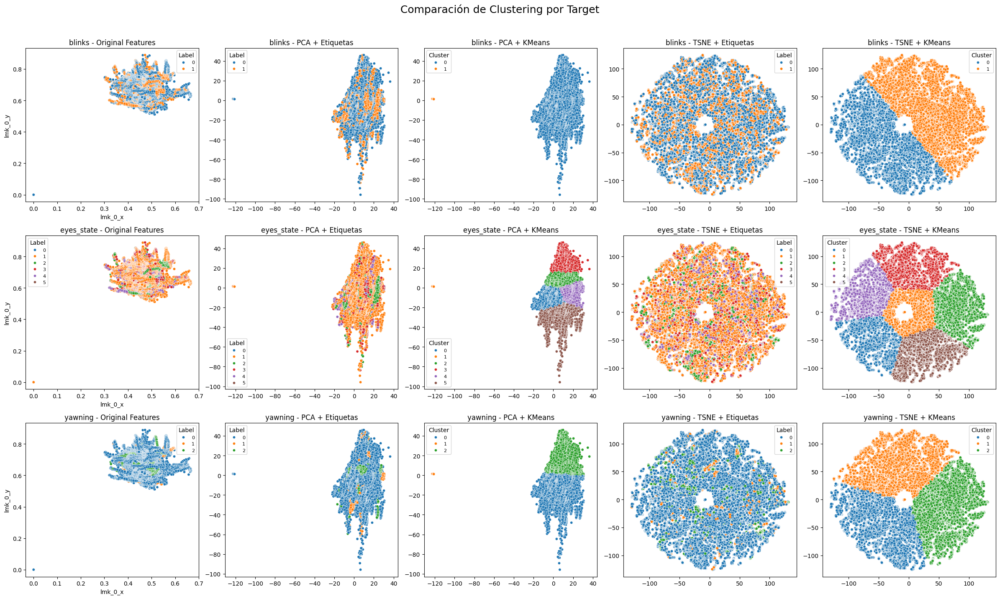

In [ ]:
#@title K-Means

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ================================
# CONFIGURACIONES DEL USUARIO
# ================================
feature_x = 'lmk_0_x'  # Cambia esto por cualquier columna del df escalado
feature_y = 'lmk_0_y'
targets = {
    'blinks': 2,
    'eyes_state': 6,
    'yawning': 3
}

# ================================
# PREPARACIÓN DE DATOS
# ================================
# Features: todas menos targets y metadatos
X = df.drop(columns=['indice_video', 'blinks', 'eyes_state', 'yawning', 'sujeto'])
y_all = df[['blinks', 'eyes_state', 'yawning']]

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reducción de dimensionalidad
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_scaled)

# ================================
# CLUSTERING + VISUALIZACIÓN
# ================================
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(24, 14))
fig.suptitle("Comparación de Clustering por Target", fontsize=18, y=1.02)

for idx, (target_name, n_clusters) in enumerate(targets.items()):
    y_true = y_all[target_name].values

    # KMeans sobre PCA y TSNE
    kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42)
    clusters_pca = kmeans_pca.fit_predict(X_pca)

    kmeans_tsne = KMeans(n_clusters=n_clusters, random_state=42)
    clusters_tsne = kmeans_tsne.fit_predict(X_tsne)

    # 1. Feature_x vs Feature_y (original)
    ax = axes[idx, 0]
    sns.scatterplot(x=df[feature_x], y=df[feature_y], hue=y_true, palette='tab10', ax=ax, s=20)
    ax.set_title(f'{target_name} - Original Features')
    ax.legend(title="Label", loc="best", fontsize=8)

    # 2. PCA (color por etiqueta original)
    ax = axes[idx, 1]
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=y_true, palette='tab10', ax=ax, s=20)
    ax.set_title(f'{target_name} - PCA + Etiquetas')
    ax.legend(title="Label", loc="best", fontsize=8)

    # 3. PCA (color por KMeans)
    ax = axes[idx, 2]
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=clusters_pca, palette='tab10', ax=ax, s=20)
    ax.set_title(f'{target_name} - PCA + KMeans')
    ax.legend(title="Cluster", loc="best", fontsize=8)

    # 4. TSNE (color por etiqueta original)
    ax = axes[idx, 3]
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=y_true, palette='tab10', ax=ax, s=20)
    ax.set_title(f'{target_name} - TSNE + Etiquetas')
    ax.legend(title="Label", loc="best", fontsize=8)

    # 5. TSNE (color por KMeans)
    ax = axes[idx, 4]
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=clusters_tsne, palette='tab10', ax=ax, s=20)
    ax.set_title(f'{target_name} - TSNE + KMeans')
    ax.legend(title="Cluster", loc="best", fontsize=8)

plt.tight_layout()
plt.show()



<ipython-input-6-aa45745a2565>:99: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


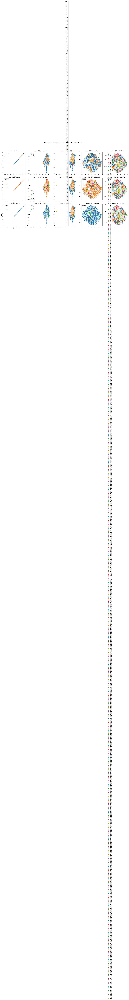

In [ ]:
#@title DBSCAN - Min_samples = 5

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ================================
# CONFIGURACIÓN DEL USUARIO
# ================================
feature_x = 'lmk_0_x'   # <- Cambia esto por la feature que quieras usar
feature_y = 'lmk_1_x'   # <- Cambia esto por la otra feature a graficar

# ================================
# PREPARACIÓN DE DATOS
# ================================
df_features = df.drop(columns=['indice_video', 'blinks', 'eyes_state', 'yawning'])
df_targets = df[['blinks', 'eyes_state', 'yawning']]

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_features)

# Reducir dimensiones a 2 con PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Reducir dimensiones a 2 con TSNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# ================================
# CLUSTERING Y VISUALIZACIÓN
# ================================
fig, axs = plt.subplots(3, 5, figsize=(25, 15))
fig.suptitle('Clustering por Target con DBSCAN + PCA + TSNE', fontsize=18)

targets_info = {
    'blinks': 2,
    'eyes_state': 6,
    'yawning': 3
}

for i, (target_name, _) in enumerate(targets_info.items()):
    y_true = df_targets[target_name].values

    # DBSCAN sobre PCA
    dbscan_pca = DBSCAN(eps=0.5, min_samples=5)
    cluster_pca = dbscan_pca.fit_predict(X_pca)

    # DBSCAN sobre TSNE
    dbscan_tsne = DBSCAN(eps=0.5, min_samples=5)
    cluster_tsne = dbscan_tsne.fit_predict(X_tsne)

    # 1. Datos originales escalados
    sns.scatterplot(
        x=df[feature_x], y=df[feature_y],
        hue=y_true, ax=axs[i, 0], palette='tab10', legend='full'
    )
    axs[i, 0].set_title(f'{target_name} - Features')
    axs[i, 0].legend(title='Etiqueta')

    # 2. PCA - Etiquetas verdaderas
    sns.scatterplot(
        x=X_pca[:, 0], y=X_pca[:, 1],
        hue=y_true, ax=axs[i, 1], palette='tab10', legend='full'
    )
    axs[i, 1].set_title(f'{target_name} - PCA (etiquetas)')
    axs[i, 1].legend(title='Etiqueta')

    # 3. PCA - Clusters DBSCAN
    sns.scatterplot(
        x=X_pca[:, 0], y=X_pca[:, 1],
        hue=cluster_pca, ax=axs[i, 2], palette='tab10', legend='full'
    )
    axs[i, 2].set_title(f'{target_name} - PCA (DBSCAN)')
    axs[i, 2].legend(title='Cluster')

    # 4. TSNE - Etiquetas verdaderas
    sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=y_true, ax=axs[i, 3], palette='tab10', legend='full'
    )
    axs[i, 3].set_title(f'{target_name} - TSNE (etiquetas)')
    axs[i, 3].legend(title='Etiqueta')

    # 5. TSNE - Clusters DBSCAN
    sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=cluster_tsne, ax=axs[i, 4], palette='tab10', legend='full'
    )
    axs[i, 4].set_title(f'{target_name} - TSNE (DBSCAN)')
    axs[i, 4].legend(title='Cluster')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


<ipython-input-7-4f2e206bc3c3>:99: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


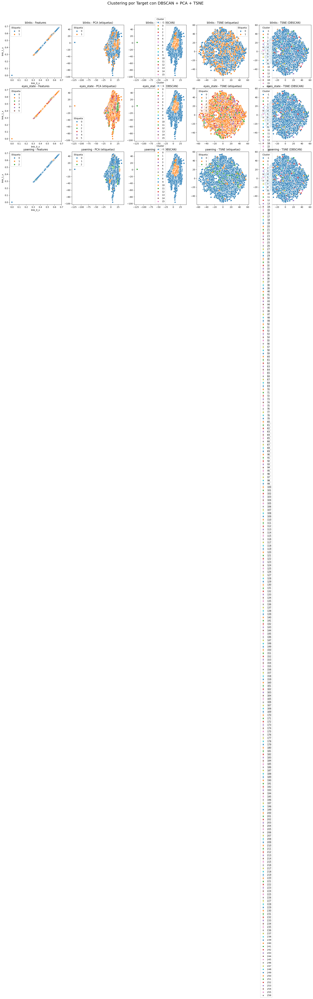

In [ ]:
#@title DBSCAN - Min_samples = 50

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ================================
# CONFIGURACIÓN DEL USUARIO
# ================================
feature_x = 'lmk_0_x'   # <- Cambia esto por la feature que quieras usar
feature_y = 'lmk_1_x'   # <- Cambia esto por la otra feature a graficar

# ================================
# PREPARACIÓN DE DATOS
# ================================
df_features = df.drop(columns=['indice_video', 'blinks', 'eyes_state', 'yawning'])
df_targets = df[['blinks', 'eyes_state', 'yawning']]

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_features)

# Reducir dimensiones a 2 con PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Reducir dimensiones a 2 con TSNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# ================================
# CLUSTERING Y VISUALIZACIÓN
# ================================
fig, axs = plt.subplots(3, 5, figsize=(25, 15))
fig.suptitle('Clustering por Target con DBSCAN + PCA + TSNE', fontsize=18)

targets_info = {
    'blinks': 2,
    'eyes_state': 6,
    'yawning': 3
}

for i, (target_name, _) in enumerate(targets_info.items()):
    y_true = df_targets[target_name].values

    # DBSCAN sobre PCA
    dbscan_pca = DBSCAN(eps=0.5, min_samples=50)
    cluster_pca = dbscan_pca.fit_predict(X_pca)

    # DBSCAN sobre TSNE
    dbscan_tsne = DBSCAN(eps=0.5, min_samples=50)
    cluster_tsne = dbscan_tsne.fit_predict(X_tsne)

    # 1. Datos originales escalados
    sns.scatterplot(
        x=df[feature_x], y=df[feature_y],
        hue=y_true, ax=axs[i, 0], palette='tab10', legend='full'
    )
    axs[i, 0].set_title(f'{target_name} - Features')
    axs[i, 0].legend(title='Etiqueta')

    # 2. PCA - Etiquetas verdaderas
    sns.scatterplot(
        x=X_pca[:, 0], y=X_pca[:, 1],
        hue=y_true, ax=axs[i, 1], palette='tab10', legend='full'
    )
    axs[i, 1].set_title(f'{target_name} - PCA (etiquetas)')
    axs[i, 1].legend(title='Etiqueta')

    # 3. PCA - Clusters DBSCAN
    sns.scatterplot(
        x=X_pca[:, 0], y=X_pca[:, 1],
        hue=cluster_pca, ax=axs[i, 2], palette='tab10', legend='full'
    )
    axs[i, 2].set_title(f'{target_name} - PCA (DBSCAN)')
    axs[i, 2].legend(title='Cluster')

    # 4. TSNE - Etiquetas verdaderas
    sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=y_true, ax=axs[i, 3], palette='tab10', legend='full'
    )
    axs[i, 3].set_title(f'{target_name} - TSNE (etiquetas)')
    axs[i, 3].legend(title='Etiqueta')

    # 5. TSNE - Clusters DBSCAN
    sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=cluster_tsne, ax=axs[i, 4], palette='tab10', legend='full'
    )
    axs[i, 4].set_title(f'{target_name} - TSNE (DBSCAN)')
    axs[i, 4].legend(title='Cluster')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

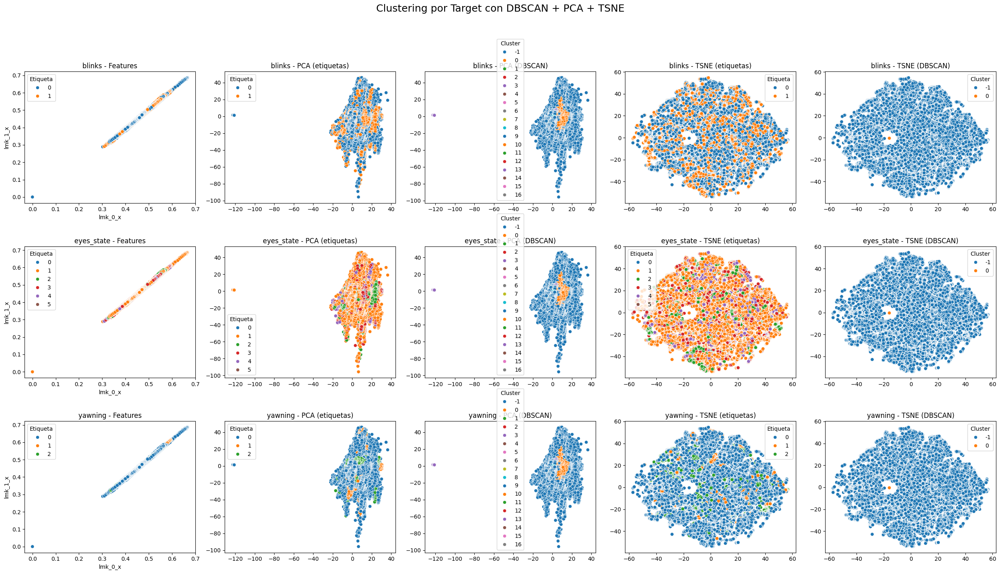

In [ ]:
#@title DBSCAN - Min_samples = 1000

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ================================
# CONFIGURACIÓN DEL USUARIO
# ================================
feature_x = 'lmk_0_x'   # <- Cambia esto por la feature que quieras usar
feature_y = 'lmk_1_x'   # <- Cambia esto por la otra feature a graficar

# ================================
# PREPARACIÓN DE DATOS
# ================================
df_features = df.drop(columns=['indice_video', 'blinks', 'eyes_state', 'yawning'])
df_targets = df[['blinks', 'eyes_state', 'yawning']]

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_features)

# Reducir dimensiones a 2 con PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Reducir dimensiones a 2 con TSNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# ================================
# CLUSTERING Y VISUALIZACIÓN
# ================================
fig, axs = plt.subplots(3, 5, figsize=(25, 15))
fig.suptitle('Clustering por Target con DBSCAN + PCA + TSNE', fontsize=18)

targets_info = {
    'blinks': 2,
    'eyes_state': 6,
    'yawning': 3
}

for i, (target_name, _) in enumerate(targets_info.items()):
    y_true = df_targets[target_name].values

    # DBSCAN sobre PCA
    dbscan_pca = DBSCAN(eps=0.5, min_samples=100)
    cluster_pca = dbscan_pca.fit_predict(X_pca)

    # DBSCAN sobre TSNE
    dbscan_tsne = DBSCAN(eps=0.5, min_samples=100)
    cluster_tsne = dbscan_tsne.fit_predict(X_tsne)

    # 1. Datos originales escalados
    sns.scatterplot(
        x=df[feature_x], y=df[feature_y],
        hue=y_true, ax=axs[i, 0], palette='tab10', legend='full'
    )
    axs[i, 0].set_title(f'{target_name} - Features')
    axs[i, 0].legend(title='Etiqueta')

    # 2. PCA - Etiquetas verdaderas
    sns.scatterplot(
        x=X_pca[:, 0], y=X_pca[:, 1],
        hue=y_true, ax=axs[i, 1], palette='tab10', legend='full'
    )
    axs[i, 1].set_title(f'{target_name} - PCA (etiquetas)')
    axs[i, 1].legend(title='Etiqueta')

    # 3. PCA - Clusters DBSCAN
    sns.scatterplot(
        x=X_pca[:, 0], y=X_pca[:, 1],
        hue=cluster_pca, ax=axs[i, 2], palette='tab10', legend='full'
    )
    axs[i, 2].set_title(f'{target_name} - PCA (DBSCAN)')
    axs[i, 2].legend(title='Cluster')

    # 4. TSNE - Etiquetas verdaderas
    sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=y_true, ax=axs[i, 3], palette='tab10', legend='full'
    )
    axs[i, 3].set_title(f'{target_name} - TSNE (etiquetas)')
    axs[i, 3].legend(title='Etiqueta')

    # 5. TSNE - Clusters DBSCAN
    sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=cluster_tsne, ax=axs[i, 4], palette='tab10', legend='full'
    )
    axs[i, 4].set_title(f'{target_name} - TSNE (DBSCAN)')
    axs[i, 4].legend(title='Cluster')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Procesando blinks...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Procesando eyes_state...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Procesando yawning...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


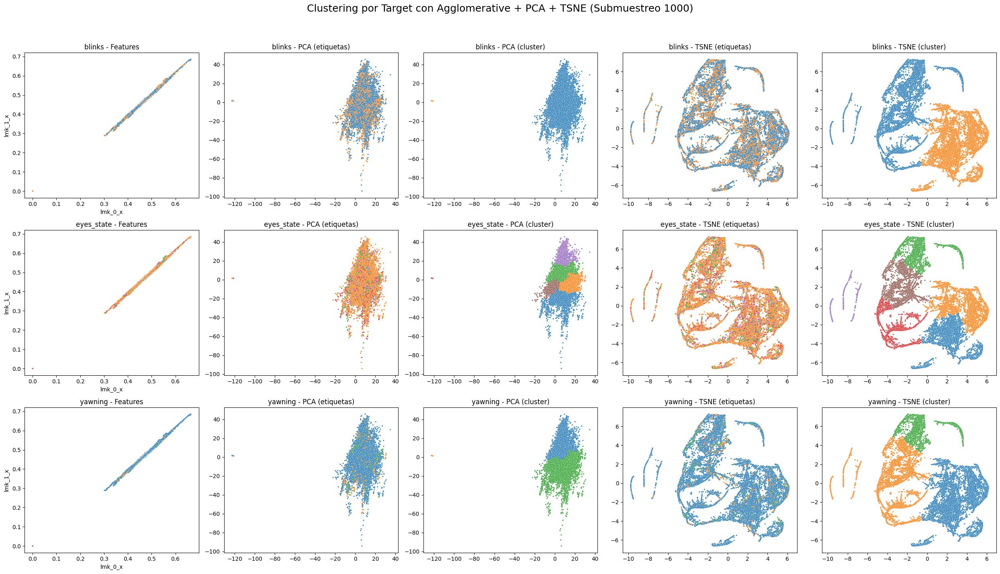

In [ ]:
#@title AgglomerativeClustering

import gc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering

# Configuración
feature_x = 'lmk_0_x'
feature_y = 'lmk_1_x'
n_samples = 30000  # Reducción máxima para evitar que colapse
targets_info = {
    'blinks': 2,
    'eyes_state': 6,
    'yawning': 3
}

# Figura para 15 gráficas
fig, axs = plt.subplots(3, 5, figsize=(25, 15))
fig.suptitle('Clustering por Target con Agglomerative + PCA + TSNE (Submuestreo 1000)', fontsize=18)

for i, (target_name, n_clusters) in enumerate(targets_info.items()):
    print(f"Procesando {target_name}...")

    # Submuestreo
    df_sample = df.sample(n=n_samples, random_state=42).copy()
    df_target = df_sample[target_name].values

    # Features
    df_features = df_sample.drop(columns=['indice_video', 'blinks', 'eyes_state', 'yawning'], errors='ignore')
    df_features = df_features.fillna(0).replace([np.inf, -np.inf], 0).astype(np.float32)

    # Escalado
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df_features)

    # PCA
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)
    cluster_pca = AgglomerativeClustering(n_clusters=n_clusters).fit_predict(X_pca)

    # TSNE
    tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=250, init='pca', random_state=42)
    X_tsne = tsne.fit_transform(X_scaled)
    cluster_tsne = AgglomerativeClustering(n_clusters=n_clusters).fit_predict(X_tsne)

    # 1. Original
    sns.scatterplot(x=df_sample[feature_x], y=df_sample[feature_y], hue=df_target,
                    ax=axs[i, 0], palette='tab10', s=5, legend=False)
    axs[i, 0].set_title(f'{target_name} - Features')

    # 2. PCA + etiquetas
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_target,
                    ax=axs[i, 1], palette='tab10', s=5, legend=False)
    axs[i, 1].set_title(f'{target_name} - PCA (etiquetas)')

    # 3. PCA + cluster
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=cluster_pca,
                    ax=axs[i, 2], palette='tab10', s=5, legend=False)
    axs[i, 2].set_title(f'{target_name} - PCA (cluster)')

    # 4. TSNE + etiquetas
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df_target,
                    ax=axs[i, 3], palette='tab10', s=5, legend=False)
    axs[i, 3].set_title(f'{target_name} - TSNE (etiquetas)')

    # 5. TSNE + cluster
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=cluster_tsne,
                    ax=axs[i, 4], palette='tab10', s=5, legend=False)
    axs[i, 4].set_title(f'{target_name} - TSNE (cluster)')

    # Limpieza
    del df_sample, df_target, df_features, X_scaled, X_pca, X_tsne, cluster_pca, cluster_tsne
    gc.collect()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


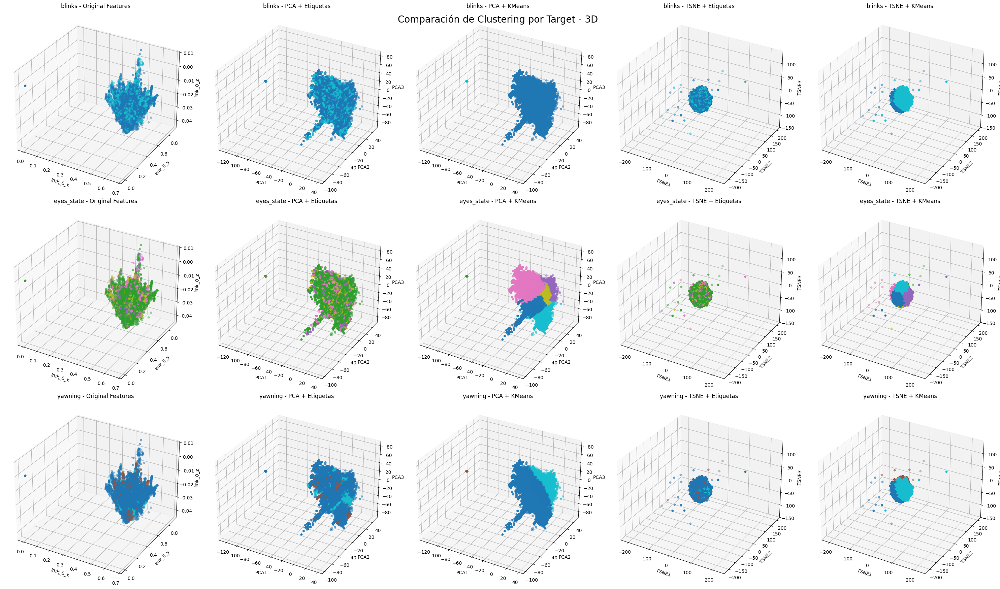

In [ ]:
#@title KMeans 3D

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # necesario para gráficos 3D
import pandas as pd

# ================================
# CONFIGURACIONES DEL USUARIO
# ================================
feature_x = 'lmk_0_x'
feature_y = 'lmk_0_y'
feature_z = 'lmk_0_z'
targets = {
    'blinks': 2,
    'eyes_state': 6,
    'yawning': 3
}

# ================================
# PREPARACIÓN DE DATOS
# ================================
X = df.drop(columns=['indice_video', 'blinks', 'eyes_state', 'yawning'])
y_all = df[['blinks', 'eyes_state', 'yawning']]

# Escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reducción a 3 componentes
pca = PCA(n_components=3, random_state=42)
X_pca = pca.fit_transform(X_scaled)

tsne = TSNE(n_components=3, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_scaled)

# ================================
# CLUSTERING + VISUALIZACIÓN
# ================================
fig = plt.figure(figsize=(30, 18))
fig.suptitle("Comparación de Clustering por Target - 3D", fontsize=20, y=0.95)

for idx, (target_name, n_clusters) in enumerate(targets.items()):
    y_true = y_all[target_name].values

    # KMeans clustering
    kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42)
    clusters_pca = kmeans_pca.fit_predict(X_pca)

    kmeans_tsne = KMeans(n_clusters=n_clusters, random_state=42)
    clusters_tsne = kmeans_tsne.fit_predict(X_tsne)

    row_offset = idx * 5

    # 1. Features originales (3D)
    ax = fig.add_subplot(3, 5, row_offset + 1, projection='3d')
    ax.scatter(df[feature_x], df[feature_y], df[feature_z], c=y_true, cmap='tab10', s=15)
    ax.set_title(f'{target_name} - Original Features')
    ax.set_xlabel(feature_x)
    ax.set_ylabel(feature_y)
    ax.set_zlabel(feature_z)

    # 2. PCA + Etiquetas originales
    ax = fig.add_subplot(3, 5, row_offset + 2, projection='3d')
    ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=y_true, cmap='tab10', s=15)
    ax.set_title(f'{target_name} - PCA + Etiquetas')
    ax.set_xlabel("PCA1")
    ax.set_ylabel("PCA2")
    ax.set_zlabel("PCA3")

    # 3. PCA + KMeans
    ax = fig.add_subplot(3, 5, row_offset + 3, projection='3d')
    ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters_pca, cmap='tab10', s=15)
    ax.set_title(f'{target_name} - PCA + KMeans')
    ax.set_xlabel("PCA1")
    ax.set_ylabel("PCA2")
    ax.set_zlabel("PCA3")

    # 4. TSNE + Etiquetas originales
    ax = fig.add_subplot(3, 5, row_offset + 4, projection='3d')
    ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], c=y_true, cmap='tab10', s=15)
    ax.set_title(f'{target_name} - TSNE + Etiquetas')
    ax.set_xlabel("TSNE1")
    ax.set_ylabel("TSNE2")
    ax.set_zlabel("TSNE3")

    # 5. TSNE + KMeans
    ax = fig.add_subplot(3, 5, row_offset + 5, projection='3d')
    ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], c=clusters_tsne, cmap='tab10', s=15)
    ax.set_title(f'{target_name} - TSNE + KMeans')
    ax.set_xlabel("TSNE1")
    ax.set_ylabel("TSNE2")
    ax.set_zlabel("TSNE3")

plt.tight_layout()
plt.show()


Procesando: blinks


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Procesando: eyes_state


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Procesando: yawning


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


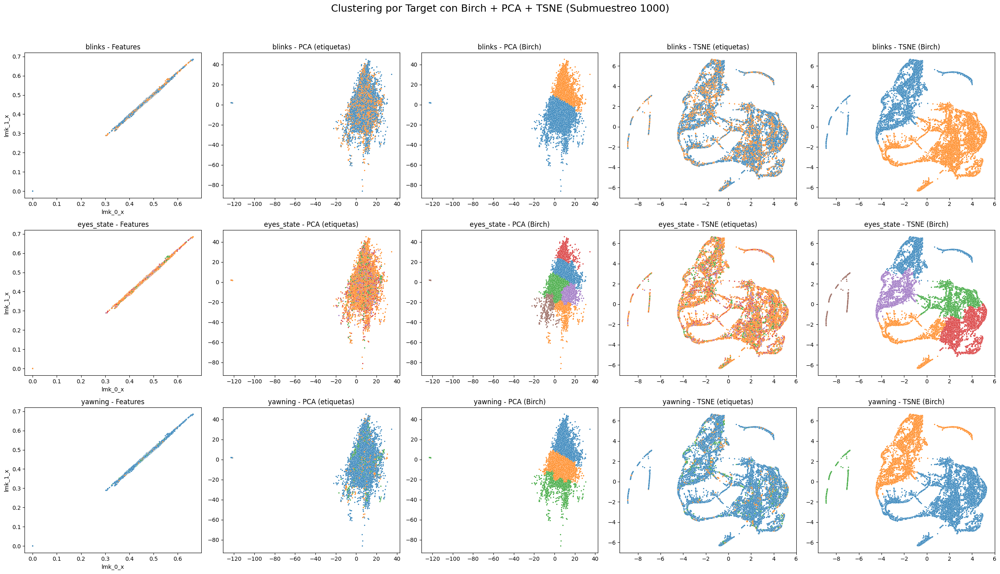

In [ ]:
#@title Birch

import gc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import Birch

# Configuración
feature_x = 'lmk_0_x'  # Cambia si deseas otra
feature_y = 'lmk_1_x'
n_samples = 20000  # Submuestreo para evitar colapso
targets_info = {
    'blinks': 2,
    'eyes_state': 6,
    'yawning': 3
}

# Figura para 15 gráficas
fig, axs = plt.subplots(3, 5, figsize=(25, 15))
fig.suptitle('Clustering por Target con Birch + PCA + TSNE (Submuestreo 1000)', fontsize=18)

for i, (target_name, n_clusters) in enumerate(targets_info.items()):
    print(f"Procesando: {target_name}")

    # Submuestreo
    df_sample = df.sample(n=n_samples, random_state=42).copy()
    df_target = df_sample[target_name].values

    # Features
    df_features = df_sample.drop(columns=['indice_video', 'blinks', 'eyes_state', 'yawning'], errors='ignore')
    df_features = df_features.fillna(0).replace([np.inf, -np.inf], 0).astype(np.float32)

    # Escalado
    X_scaled = StandardScaler().fit_transform(df_features)

    # PCA
    X_pca = PCA(n_components=2, random_state=42).fit_transform(X_scaled)
    cluster_pca = Birch(n_clusters=n_clusters).fit_predict(X_pca)

    # TSNE (ligero)
    X_tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=250, init='pca', random_state=42).fit_transform(X_scaled)
    cluster_tsne = Birch(n_clusters=n_clusters).fit_predict(X_tsne)

    # 1. Original
    sns.scatterplot(x=df_sample[feature_x], y=df_sample[feature_y], hue=df_target,
                    ax=axs[i, 0], palette='tab10', s=5, legend=False)
    axs[i, 0].set_title(f'{target_name} - Features')

    # 2. PCA + etiquetas
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_target,
                    ax=axs[i, 1], palette='tab10', s=5, legend=False)
    axs[i, 1].set_title(f'{target_name} - PCA (etiquetas)')

    # 3. PCA + Birch
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=cluster_pca,
                    ax=axs[i, 2], palette='tab10', s=5, legend=False)
    axs[i, 2].set_title(f'{target_name} - PCA (Birch)')

    # 4. TSNE + etiquetas
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df_target,
                    ax=axs[i, 3], palette='tab10', s=5, legend=False)
    axs[i, 3].set_title(f'{target_name} - TSNE (etiquetas)')

    # 5. TSNE + Birch
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=cluster_tsne,
                    ax=axs[i, 4], palette='tab10', s=5, legend=False)
    axs[i, 4].set_title(f'{target_name} - TSNE (Birch)')

    # Limpiar memoria
    del df_sample, df_target, df_features, X_scaled, X_pca, X_tsne, cluster_pca, cluster_tsne
    gc.collect()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Procesando: blinks


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Procesando: eyes_state


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Procesando: yawning


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


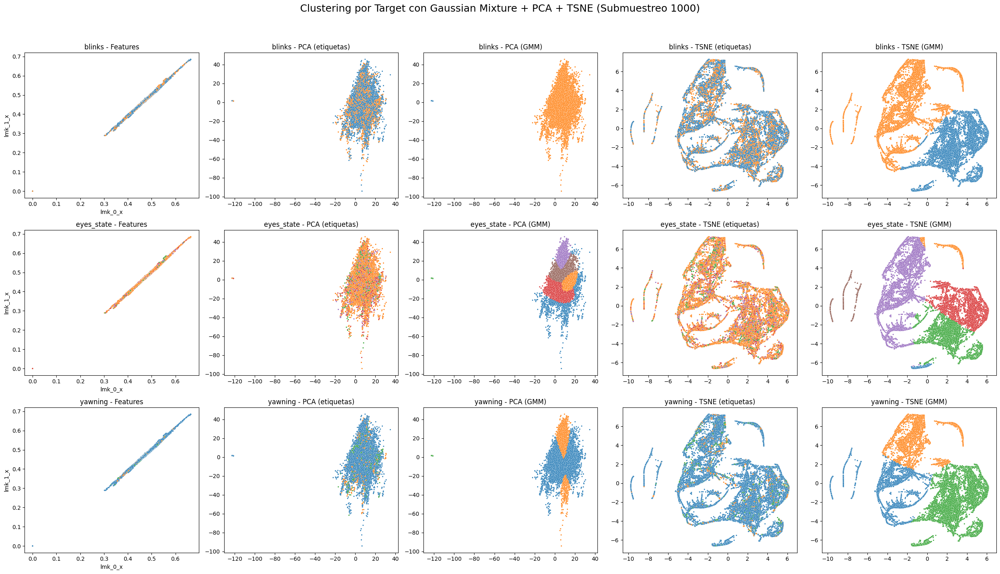

In [ ]:
#@title GaussianMixture

import gc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture

# Configuración
feature_x = 'lmk_0_x'
feature_y = 'lmk_1_x'
n_samples = 30000
targets_info = {
    'blinks': 2,
    'eyes_state': 6,
    'yawning': 3
}

# Crear figura
fig, axs = plt.subplots(3, 5, figsize=(25, 15))
fig.suptitle('Clustering por Target con Gaussian Mixture + PCA + TSNE (Submuestreo 1000)', fontsize=18)

for i, (target_name, n_clusters) in enumerate(targets_info.items()):
    print(f"Procesando: {target_name}")

    # Submuestreo
    df_sample = df.sample(n=n_samples, random_state=42).copy()
    df_target = df_sample[target_name].values

    # Features
    df_features = df_sample.drop(columns=['indice_video', 'blinks', 'eyes_state', 'yawning'], errors='ignore')
    df_features = df_features.fillna(0).replace([np.inf, -np.inf], 0).astype(np.float32)

    # Escalado
    X_scaled = StandardScaler().fit_transform(df_features)

    # PCA
    X_pca = PCA(n_components=2, random_state=42).fit_transform(X_scaled)
    cluster_pca = GaussianMixture(n_components=n_clusters, random_state=42).fit_predict(X_pca)

    # TSNE
    X_tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=250, init='pca', random_state=42).fit_transform(X_scaled)
    cluster_tsne = GaussianMixture(n_components=n_clusters, random_state=42).fit_predict(X_tsne)

    # 1. Features originales
    sns.scatterplot(x=df_sample[feature_x], y=df_sample[feature_y], hue=df_target,
                    ax=axs[i, 0], palette='tab10', s=5, legend=False)
    axs[i, 0].set_title(f'{target_name} - Features')

    # 2. PCA + etiquetas
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_target,
                    ax=axs[i, 1], palette='tab10', s=5, legend=False)
    axs[i, 1].set_title(f'{target_name} - PCA (etiquetas)')

    # 3. PCA + GMM
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=cluster_pca,
                    ax=axs[i, 2], palette='tab10', s=5, legend=False)
    axs[i, 2].set_title(f'{target_name} - PCA (GMM)')

    # 4. TSNE + etiquetas
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df_target,
                    ax=axs[i, 3], palette='tab10', s=5, legend=False)
    axs[i, 3].set_title(f'{target_name} - TSNE (etiquetas)')

    # 5. TSNE + GMM
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=cluster_tsne,
                    ax=axs[i, 4], palette='tab10', s=5, legend=False)
    axs[i, 4].set_title(f'{target_name} - TSNE (GMM)')

    # Liberar memoria
    del df_sample, df_target, df_features, X_scaled, X_pca, X_tsne, cluster_pca, cluster_tsne
    gc.collect()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
